In [1]:
from sys import stdout

import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image

import tensorflow as tf
from tensorflow import keras

import segpy
from segpy.reader import create_reader

# 一、数据预处理

## 1.地震数据读取

#### 在地震数据读取上主要是按道来读取，本代码中展示的是2D数据读取，3D代码亦同理

In [2]:
filename="copy_pcs_2000.sgy"
with open(filename, 'rb') as segy:
    segy_reader = segpy.reader.create_reader(segy)
    data = np.zeros((segy_reader.num_trace_samples(1),segy_reader.num_traces()))
    for trace_index in segy_reader.trace_indexes():
        data[:,trace_index] = segy_reader.trace_samples(trace_index)

#### 对数据进行标准化处理

In [3]:
data = (data-np.min(data))/(np.max(data)-np.min(data))

In [4]:
data.shape

(1501, 2000)

In [ ]:
plt.figure(figsize=(60,90),dpi=300)
plt.imshow(data[:,:], cmap='gray')

#### 绘图并保存

In [5]:
plt.imsave('Part2_test.png',data[:,:],cmap='gray',dpi=500)

## 2.层位数据处理

#### 本部分的代码思路是先把从HRS中得出层位信息进行用pandas进行处理，这里面插值的部分还未完全依靠代码实现，需要依靠excel的处理，处理过后再绘图

### part1：处理HRS中的层位数据，并将处理后的数据导入到新的csv中

In [7]:
horizon_reader = pd.read_csv('horizon_pcs_2000.csv',)
horizon_data = pd.DataFrame(horizon_reader)
horizon_data

,trace
0,1 2512.4878
1,2 2512.4878
2,3 2512.4878
3,4 2512.4878
4,5 2512.4878
...,...
1995,1996 2564.7212
1996,1997 2565.9189
1997,1998 2566.384
1998,1999 2568.9829


In [8]:
new_horizon = horizon_data['trace'].str.split(' ',expand=True)
new_horizon

,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
0,1,,,,,,,,,,...,,,,,,,,None,None,None
1,2,,,,,,,,,,...,,,,,,,,None,None,None
2,3,,,,,,,,,,...,,,,,,,,None,None,None
3,4,,,,,,,,,,...,,,,,,,,None,None,None
4,5,,,,,,,,,,...,,,,,,,,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,1996,,,,,,,,,,...,,,,,None,None,None,None,None,None
1996,1997,,,,,,,,,,...,,,,,None,None,None,None,None,None
1997,1998,,,,,,,,,,...,,,,,,None,None,None,None,None
1998,1999,,,,,,,,,,...,,,,,None,None,None,None,None,None


In [9]:
new_horizon.to_csv('horizon_pcs_2000_final_horizon.csv')

### part2：将处理过后的csv数据读取并成图

In [10]:
new_hor_reader = pd.read_csv('horizon_pcs_2000_final_horizon.csv')
new_hor_data = pd.DataFrame(new_hor_reader)
new_hor_data.info()
new_hor_data[0:24]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   trace   2000 non-null   int64  
 1   time    2000 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 31.4 KB


,trace,time
0,1,2512.4878
1,2,2512.4878
2,3,2512.4878
3,4,2512.4878
4,5,2512.4878
5,6,2512.4878
6,7,2512.4878
7,8,2512.4878
8,9,2512.4878
9,10,2512.4878


In [11]:
line = new_hor_data['time'].fillna(method='bfill')

In [9]:
'''
plt.figure(figsize=(60,90),dpi=300)
plt.axis([0,900,0,6000])
plt.gca().invert_yaxis()
line.plot()
'''

'\nplt.figure(figsize=(60,90),dpi=300)\nplt.axis([0,900,0,6000])\nplt.gca().invert_yaxis()\nline.plot()\n'

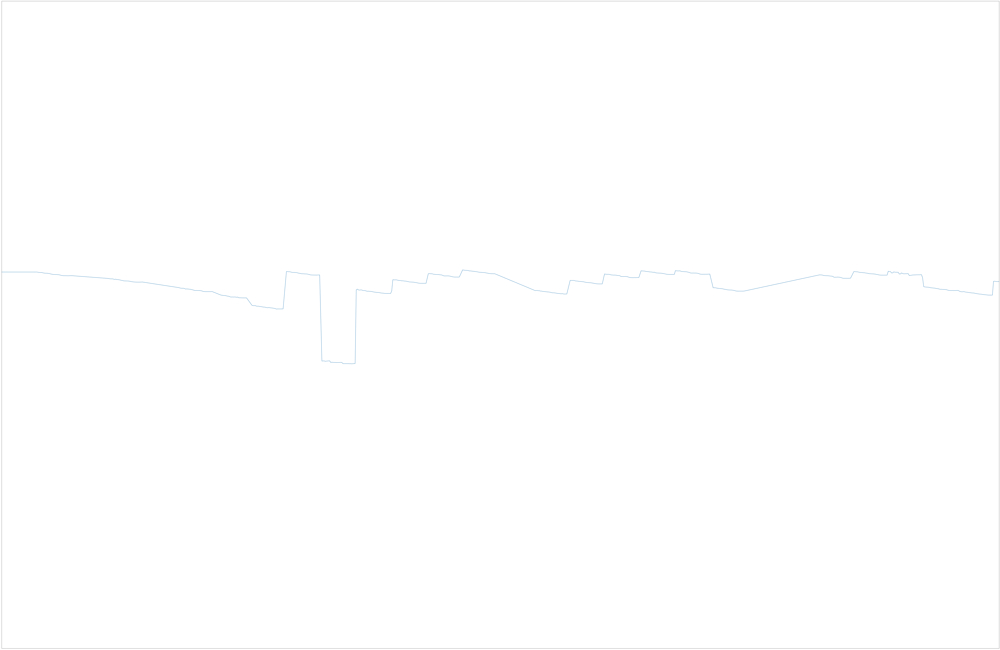

In [12]:
ax = line.plot(figsize=(120,80))
ax.set(xlim=(0, 900), ylim=(0, 6001))
ax.invert_yaxis()
ax.set_xticks([])
ax.set_yticks([])
fig = ax.get_figure()


In [9]:
fig.savefig('part2_horizon.png',dpi=75)

## 3.地震数据与层位数据叠合显示

In [13]:
hori_data = np.zeros((segy_reader.num_trace_samples(1),segy_reader.num_traces()))
for i in segy_reader.trace_indexes():
    first_break = np.zeros(shape=(1501))
    time = int(line[i])-2000
    first_break[time]= 1.0
    hori_data[:,i] =first_break

In [14]:
def plot_overlay(image, label):
    (tmax, xmax) = np.shape(image)

    label_rgb = np.zeros((tmax,xmax,4), 'uint8')
    label_rgb[:,:,0] = 255
    label_rgb[:,:,1] = 255 - 255*label
    label_rgb[:,:,2] = 255 - 255*label
    label_rgb[:,:,3] = 255*label   
    
    img = Image.fromarray(label_rgb, mode='RGBA')
    
    image_rgb = np.zeros((tmax,xmax,4), 'uint8')    
    image_rgb[:,:,0] = 255*image
    image_rgb[:,:,1] = 255*image
    image_rgb[:,:,2] = 255*image
    image_rgb[:,:,3] = 255
    
    background = Image.fromarray(image_rgb, mode='RGBA')    
    background.paste(img, (0, 0), img)
    background.save('final_data.png')
    plt.imshow(background)
    #plt.imsave('final_data.png',background,dpi=300)
    plt.xticks([])
    plt.yticks([])

#### 这里面的hori_data这个矩阵实际上就是我们常说的label，不过本例中并不是把一个图像读取出来再化为label，而是直接省去了中间环节，得到了这个hori_data1作为label

([], [])

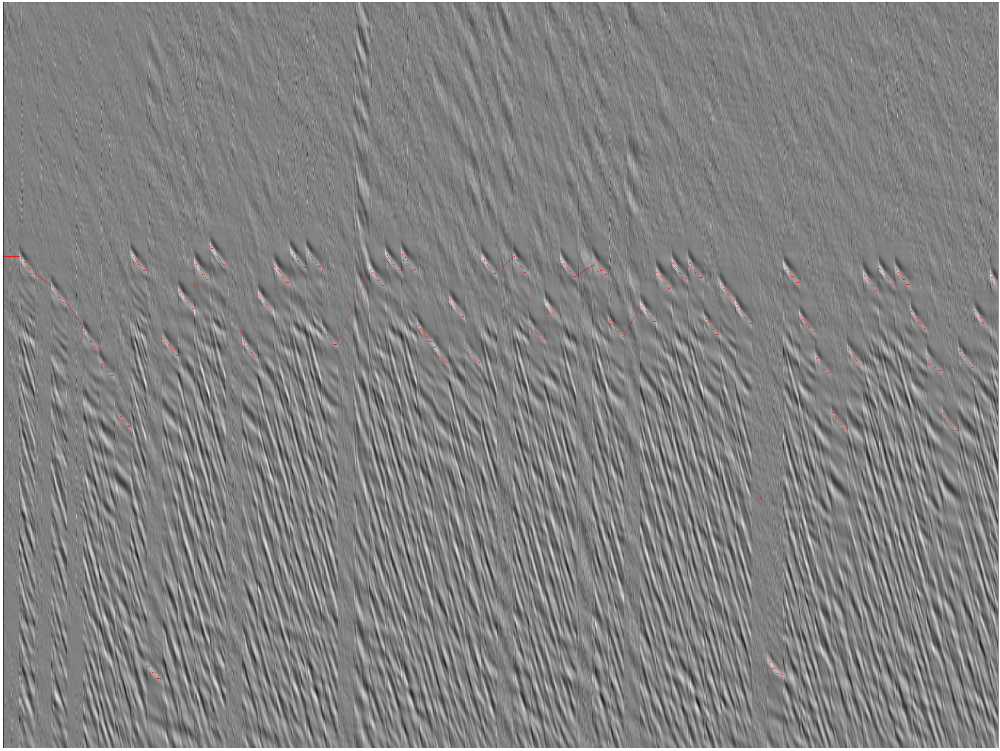

In [15]:
plt.figure(figsize=(60,900))
plot_overlay(data[:,:],hori_data[:,:])
plt.xticks([])
plt.yticks([])

## 4.制作并查看训练数据

In [11]:
hori_data.shape

(1501, 2000)

In [14]:
def patchify(data, label, size, number, threshold):

    (t_max, x_max) = label.shape    
    X = np.zeros((number, size, size, 1))
    Y = np.zeros((number, size, size, 1))
        
    n = 0
    while n < number: 
        x = random.randint(size//2, x_max-size//2)
        t = random.randint(size//2, t_max-size//2)
        if np.count_nonzero(label[t-size//2:t+size//2, x-size//2:x+size//2]) > threshold:
            X[n,:,:,0]  = data[t-size//2:t+size//2, x-size//2:x+size//2]
            Y[n,:,:,0]  = label[t-size//2:t+size//2, x-size//2:x+size//2]
            n = n + 1
    return X, Y


# 参数
size       = 64
threshold  = 0
num_train  = 8000
num_val    = 2000


# 验证集
X_val = np.zeros((num_val,size,size,1))
Y_val = np.zeros((num_val,size,size,1))
#这里预留验证集的时候，要根据上面的导数适当的留好
label_val   = hori_data[:,1800:]
seismic_val = data[...,1800:]
X_val,Y_val = patchify(seismic_val, label_val, size, num_val, threshold)


# 训练数据
X_train = np.zeros((num_train,size,size,1))
Y_train = np.zeros((num_train,size,size,1))

label_train   = hori_data[:,:1800]
seismic_train = data[...,:1800]
X_train, Y_train= patchify(seismic_train, label_train, size, num_train, threshold) 


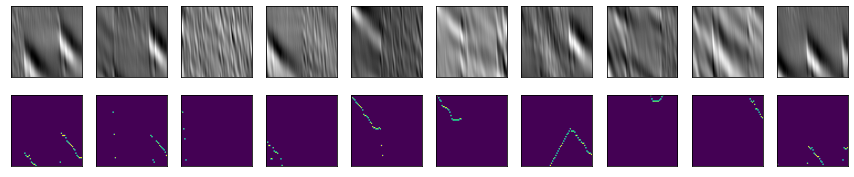

In [13]:
fig, axs = plt.subplots(2, 10, figsize=(15,3))

k = 0
for m in range(10):
    axs[0,m].imshow(X_train[k,:,:,0], interpolation='spline16', cmap=plt.cm.gray, aspect=1)
    axs[0,m].set_xticks([])
    axs[0,m].set_yticks([])
    k += 1

k = 0
for m in range(10):
    axs[1,m].imshow(Y_train[k,:,:,0], interpolation='spline16', aspect=1)
    axs[1,m].set_xticks([])
    axs[1,m].set_yticks([])
    k += 1

# 二、U-net搭建及模型训练

## 1.U-net搭建

In [19]:
from scipy.ndimage import gaussian_filter
%load_ext tensorboard
%tensorboard --logdir logs

ERROR: Failed to launch TensorBoard (exited with 1).
Contents of stderr:
2022-05-24 10:51:42.604528: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library cudart64_101.dll
Traceback (most recent call last):
  File "E:\Python\anaconda\envs\seismic_deep_learning\Scripts\tensorboard-script.py", line 9, in <module>
    sys.exit(run_main())
  File "E:\Python\anaconda\envs\seismic_deep_learning\lib\site-packages\tensorboard\main.py", line 65, in run_main
    default.get_plugins(),
  File "E:\Python\anaconda\envs\seismic_deep_learning\lib\site-packages\tensorboard\default.py", line 108, in get_plugins
    return get_static_plugins() + get_dynamic_plugins()
  File "E:\Python\anaconda\envs\seismic_deep_learning\lib\site-packages\tensorboard\default.py", line 146, in get_dynamic_plugins
    "tensorboard_plugins"
  File "E:\Python\anaconda\envs\seismic_deep_learning\lib\site-packages\tensorboard\default.py", line 145, in <listcomp>
    for entry_point

In [20]:
def down_block(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    c = tf.keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(x)
    c = tf.keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(c)
    p = tf.keras.layers.MaxPool2D((2, 2), (2, 2))(c)
    return c, p

def up_block(x, skip, filters, kernel_size=(3, 3), padding="same", strides=1):
    us = tf.keras.layers.UpSampling2D((2, 2))(x)
    concat = tf.keras.layers.Concatenate()([us, skip])
    c = tf.keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(concat)
    c = tf.keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(c)
    return c

def bottleneck(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    c = tf.keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(x)
    c = tf.keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu")(c)
    return c

  


def UNet():
    f = [16, 32, 64, 128, 256]
    inputs = tf.keras.layers.Input((size, size, 1))
  
    p0 = inputs
    c1, p1 = down_block(p0, f[0]) #128 -> 64
    c2, p2 = down_block(p1, f[1]) #64 -> 32
    c3, p3 = down_block(p2, f[2]) #32 -> 16
    c4, p4 = down_block(p3, f[3]) #16->8
  
    bn = bottleneck(p4, f[4])
  
    u1 = up_block(bn, c4, f[3]) #8 -> 16
    u2 = up_block(u1, c3, f[2]) #16 -> 32
    u3 = up_block(u2, c2, f[1]) #32 -> 64
    u4 = up_block(u3, c1, f[0]) #64 -> 128
   
    outputs = tf.keras.layers.Conv2D(1, (1, 1), padding="same", activation="sigmoid")(u4)
    model = tf.keras.models.Model(inputs, outputs)
    return model


model = UNet()
model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["acc"])

In [21]:
model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 64, 64, 1)]  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 64, 64, 16)   160         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 64, 64, 16)   2320        conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 32, 32, 16)   0           conv2d_1[0][0]                   
_______________________________________________________________________________________

## 2.开始训练

In [1]:
import datetime, os
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

checkpointer = tf.keras.callbacks.ModelCheckpoint("model1.h5", verbose=1, save_best_only=True)
history = model.fit(X_train, 
                    Y_train, 
                    validation_data=(X_val, Y_val), 
                    epochs=10,
                    callbacks=[tensorboard,checkpointer]
                   )

NameError: name 'tf' is not defined

## 3.绘制精度曲线

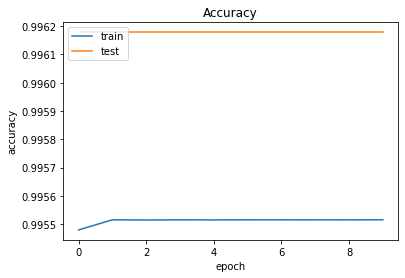

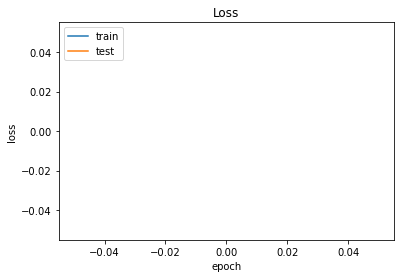

In [24]:
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


## 4.绘制混淆矩阵

In [95]:
from sklearn.metrics import confusion_matrix

Y_pred = model.predict(X_val)
Y_true = Y_val    

cm = np.zeros((2,2))

for n in range(Y_true.shape[0]):

    y_true = Y_true[n,:,:,0].round().flatten()
    y_pred = Y_pred[n,:,:,0].round().flatten()

    cm_batch = confusion_matrix(y_true, y_pred)
              

    cm = cm + cm_batch

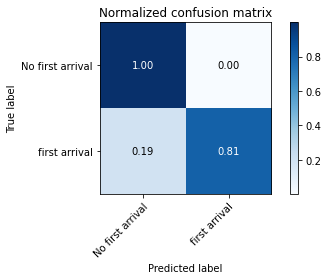

In [96]:
cmap=plt.cm.Blues
normalize = True

title = 'Normalized confusion matrix'


# 使用出现过的初至作为信息
classes = ['No first arrival','first arrival']

# 标准化
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


fig, ax = plt.subplots()
im = ax.imshow(cm_norm, interpolation='nearest', cmap=cmap)
ax.figure.colorbar(im, ax=ax)
# 展示所有的标签
ax.set(xticks=np.arange(cm_norm.shape[1]),
       yticks=np.arange(cm_norm.shape[0]),
       # 并用各自的列表条目对其标记
       xticklabels=classes, yticklabels=classes,
       title=title,
       ylabel='True label',
       xlabel='Predicted label')

# 旋转标记标签并设置它们的对齐方式
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# 循环数据维度并创建文本注释。
fmt = '.2f' if normalize else 'd'
thresh = cm_norm.max() / 2.
for i in range(cm_norm.shape[0]):
    for j in range(cm_norm.shape[1]):
        ax.text(j, i, format(cm_norm[i, j], fmt),
                ha="center", va='center',
                color="white" if cm_norm[i, j] > thresh else "black")
fig.tight_layout()

# 三、神经网络的应用

#### 这里主要是把此处网络的训练成果应用到另一个数据体上查看效果如何

In [25]:
filename_test="copy_pcs_1000.sgy"
with open(filename_test, 'rb') as segy:
    segy_reader_test = segpy.reader.create_reader(segy)
    data_test = np.zeros((segy_reader_test.num_trace_samples(1),segy_reader_test.num_traces()))
    for trace_index in segy_reader_test.trace_indexes():
        data_test[:,trace_index] = segy_reader_test.trace_samples(trace_index)
data_test = (data_test-np.min(data_test))/(np.max(data_test)-np.min(data_test))

##### 如果是三维，则按照如下的代码进行写入

In [ ]:
'''


with open(filename, 'rb') as segy:
    segy_reader = segpy.reader.create_reader(segy)
    data = np.zeros((segy_reader.num_inlines(), segy_reader.num_trace_samples(1), segy_reader.num_xlines()))
    for inline_num, xline_num in segy_reader.inline_xline_numbers():
        trace_index = segy_reader.trace_index((inline_num, xline_num))        
        inline_start = segy_reader.inline_numbers()[0]
        xline_start  = segy_reader.xline_numbers()[0]        
        data[inline_num-inline_start,:,xline_num-xline_start] = segy_reader.trace_samples(trace_index)

data = (data-np.min(data))/(np.max(data)-np.min(data))


'''

In [26]:
data_test.shape

(3501, 1001)

([], [])

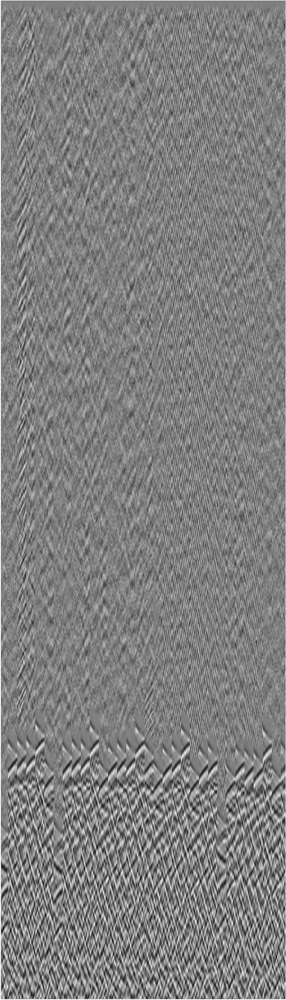

In [27]:
def tile(data, wsize, dt, dx):
    
    (t_max, x_max) = data.shape    
    
    n_patch = (t_max//dt+1)*(x_max//dx+1)
    data_patch = np.zeros((n_patch,wsize,wsize,1)) 

    n = 0
    for t in range(0, t_max, dt):
        for x in range(0, x_max, dx):    
            if t_max - t < wsize and x_max - x < wsize:
                data_patch[n,:,:,0] = data[t_max-wsize:t_max, x_max-wsize:x_max]
            elif x_max - x < wsize:
                data_patch[n,:,:,0] = data[t:t+wsize, x_max-wsize:x_max]
            elif t_max - t < wsize:
                data_patch[n,:,:,0] = data[t_max-wsize:t_max, x:x+wsize]
            else:
                data_patch[n,:,:,0] = data[t:t+wsize,x:x+wsize]  
            n = n + 1
    
    return data_patch 




def merge(data_patch, t_max, x_max, wsize, dt, dx):

    data_new = np.zeros((t_max, x_max,1))
    count = np.zeros((t_max, x_max, 1))
    
    n = 0
    for t in range(0, t_max, dt):
        for x in range(0, x_max, dx):
            if t_max - t < wsize and x_max - x < wsize:
                data_new[t_max-wsize:t_max, x_max-wsize:x_max,0] += data_patch[n,:,:,0]
                count[t_max-wsize:t_max, x_max-wsize:x_max,0] += 1
            elif x_max - x < wsize:
                data_new[t:t+wsize, x_max-wsize:x_max,0] += data_patch[n,:,:,0]
                count[t:t+wsize, x_max-wsize:x_max,0] += 1 
            elif t_max - t < wsize:
                data_new[t_max-wsize:t_max, x:x+wsize,0] += data_patch[n,:,:,0]
                count[t_max-wsize:t_max, x:x+wsize,0] += 1
            else:
                data_new[t:t+wsize,x:x+wsize,0] += data_patch[n,:,:,0]
                count[t:t+wsize,x:x+wsize,0] += 1 
            n = n + 1

    return data_new/count


dt = 64
dx = 16

(t_max, x_max) = data_test.shape

plt.figure(figsize=(60,900))
data_tiles   = tile(data_test, size, dt, dx)
result_tiles = model.predict_on_batch(data_tiles)
result       = merge(result_tiles, t_max, x_max, size, dt, dx)
plot_overlay(data_test, result[:,:,0])
plt.xticks([])
plt.yticks([])

## 初至导出

#### 遍历result的每个道，返回最大概率的索引值，作为时间

##### 把上面神经网络预测的每道的初至时间的概率放到一个新建的数组中(2维），方便后面遍历

In [45]:
predict_data=pd.DataFrame(result[:,:,0])
print(predict_data.shape)

(2000, 271)


##### 通过循环，将拾取的初至提出出，并存放在一个名为predict_result的数组中

In [46]:
predict_result = pd.DataFrame(np.arange(x_max),columns=['time'])
for i in range(x_max):
    pre_col = predict_data.iloc[:,i]
    predict_result.loc[i] = pre_col.argmax()
predict_result.shape

(271, 1)

##### 利用滤波器平滑处理（不到迫不得已不用）

In [149]:
'''
from scipy.signal import savgol_filter
filter_data = savgol_filter(predict_result['time'],11,8,mode='nearest')
filter_dataframe=pd.DataFrame(filter_data,columns=['time'])
'''

"\nfrom scipy.signal import savgol_filter\nfilter_data = savgol_filter(predict_result['time'],11,8,mode='nearest')\nfilter_dataframe=pd.DataFrame(filter_data,columns=['time'])\n"

### 绘制一下图片，查看一下效果，效果不好则平滑一下数据

In [47]:
predict_result['time'].describe()

count     271.000000
mean     1638.177122
std       163.487359
min      1355.000000
25%      1504.500000
50%      1636.000000
75%      1768.500000
max      1999.000000
Name: time, dtype: float64

##### 一个剔除异常点的简单算法，这里面的步长要根据每炮的道数进行适当调整，平滑的效果会好

In [48]:
for t in range(0, x_max,30):
    if x_max - t >= 30:
        point_of_time = np.zeros(30)
        for i in range (30):
            point_of_time[i] = predict_result['time'].loc[t+i]
        mean_of_time = point_of_time.mean()
        for j in range (30):
            if abs(point_of_time[j]-mean_of_time)> 200:
                predict_result['time'].loc[t+j] =  predict_result['time'].loc[t+j+1]
    else:
        break

#### 下面是根据数据分布的四分位点，把四分位点以外的数据去掉

In [50]:
del_line = predict_result['time'].quantile(0.5)
del_line

1621.0

In [51]:
for i in range(0,x_max):
    if predict_result['time'].loc[i]-del_line>100:
        predict_result['time'].loc[i] = predict_result['time'].loc[t-2]

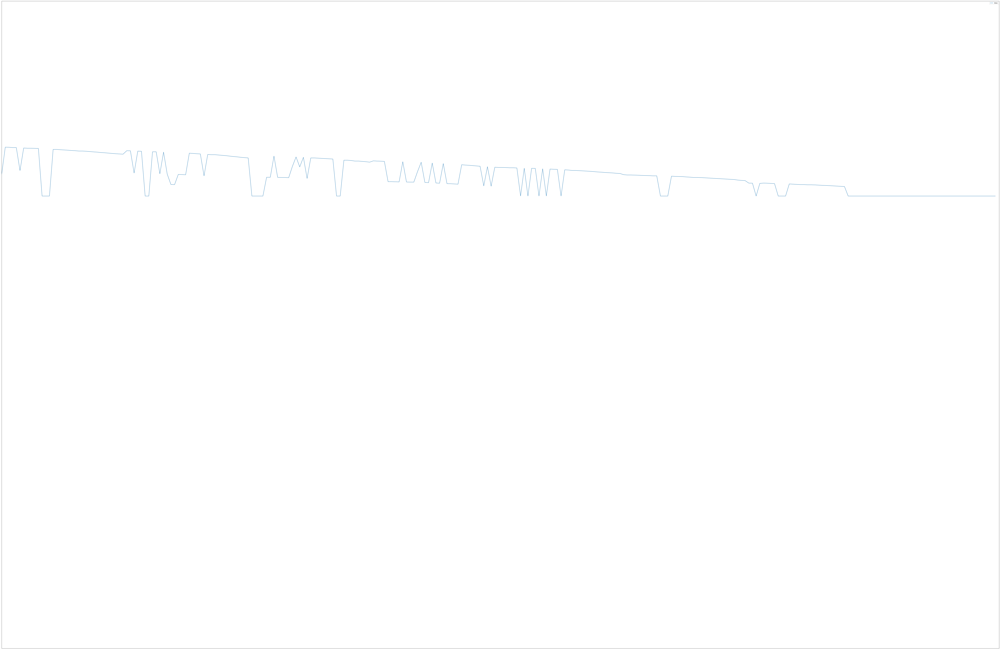

In [52]:
ax = predict_result.plot(figsize=(120,80))

ax.set(xlim=(0, x_max), ylim=(0, t_max))

ax.invert_yaxis()

ax.set_xticks([])

ax.set_yticks([])

fig = ax.get_figure()


##### 为predict_result和filter_dataframe添加新的列，这样方便HRS读取

In [217]:
'''
filter_dataframe['xline']= 1
filter_dataframe['inline'] = np.arange(1,x_max+1)
filter_dataframe.shape
'''

(739, 3)

In [26]:
predict_result['xline']= 1
predict_result['inline'] = np.arange(0,x_max,1)
predict_result.shape

(271, 3)

##### 数据导出

In [27]:

predict_result.to_csv('bandpass_zs_predict_after_filter.csv')

##### 再次检查导出的数据是否准确，若准确，则可以导出，否则需要进一步处理

In [28]:

pre_data = np.zeros((t_max,x_max))
for i in range(x_max):
    first_break = np.zeros(shape=(t_max))
    time = int(predict_result['time'].loc[i])
    first_break[time]= 1.0
    pre_data[:,i] =first_break

In [29]:
plt.figure(figsize=(60,900))
plot_overlay(data_test[:,:],pre_data[:,:])
plt.xticks([])
plt.yticks([])

([], [])